# read PDFs, makeproject, extract images and create octrees



### variables



In [27]:
# where is ami3? (assume you have checked out or copied `ami3` distrib).
# set AMI3 to location of LOCAL AMI repository
# EDIT THIS >>>>>>>
HOME = "/Users/pm286/"
WORKSPACE = HOME + "workspace/"
AMI3 = WORKSPACE + "cmdev/ami3/"
# <<<<<<<<<<

# local workspace
# EDIT this >>>>>>>>
WORK = WORKSPACE + "work/"
# <<<<<<<<<<

# specific problem
# EDIT THIS to your project (battery10, thermo at present)
# >>>>>>>
PROJECT = "battery10"
# <<<<<<<

PROJECT_WORK = WORK + PROJECT + "/"

# general data resource within the `ami3` distrib
# IPYNB = AMI3 + "src/ipynb/"
TEST_RESOURCES = AMI3 + "src/test/resources/"
AMI_DATA = TEST_RESOURCES + "org/contentmine/ami/"

# specific for projects under ami3/src/test/resources
PROJECT_DATA = AMI_DATA + PROJECT + ".raw" + "/"

In [28]:

print ("working in " + PROJECT_WORK)
! cd $PROJECT_WORK
! ls
print ("copying raw project " + PROJECT_DATA + " => " + PROJECT_WORK)
! cp -R $PROJECT_DATA $PROJECT_WORK

working in /Users/pm286/workspace/work/battery10/
PMC3211491        PMC3893646        PMC4148673        pdf2octree.ipynb
PMC3463005        PMC3909895        PMC4177134
PMC3518813        PMC4062906        logs
PMC3776197        PMC4100024        make_project.json
copying raw project /Users/pm286/workspace/cmdev/ami3/src/test/resources/org/contentmine/ami/battery10.raw/ => /Users/pm286/workspace/work/battery10/


In [29]:
ls

PMC3211491/        PMC3893646/        PMC4148673/        pdf2octree.ipynb
PMC3463005/        PMC3909895/        PMC4177134/
PMC3518813/        PMC4062906/        logs/
PMC3776197/        PMC4100024/        make_project.json


In [30]:
## make project
! ami -p . makeproject --rawfiletypes pdf
! ls */*.pdf
! ls */*.xml


Generic values (AMIMakeProjectTool)

Specific values (AMIMakeProjectTool)
PMC3211491/fulltext.pdf PMC3893646/fulltext.pdf PMC4148673/fulltext.pdf
PMC3463005/fulltext.pdf PMC3909895/fulltext.pdf PMC4177134/fulltext.pdf
PMC3518813/fulltext.pdf PMC4062906/fulltext.pdf
PMC3776197/fulltext.pdf PMC4100024/fulltext.pdf
ls: */*.xml: No such file or directory


In [31]:
! ami -vv -p . pdfbox

(The console will show DEBUG level messages)
(Logs will also be printed to /Users/pm286/workspace/work/battery10/logs/ami.log)
Version: ami 2020.08.09_09.54-NEXT-SNAPSHOT
(jar:file:/Users/pm286/workspace/cmdev/ami3/target/appassembler/repo/ami3-2020.08.09_09.54-NEXT-SNAPSHOT.jar)
JVM: 14.0.1 (Oracle Corporation Java HotSpot(TM) 64-Bit Server VM 14.0.1+7)
OS: Mac OS X 10.15.6 x86_64


Generic values (AMIPDFTool)
input basename      null
input basename list null
cproject            /Users/pm286/workspace/work/battery10/.
ctree               
cTreeList           12 trees [./.ipynb_checkpoints, ./PMC3211491, ./PMC3463005,
excludeBase         {}
excludeTrees        {}
forceMake           false
includeBase         {}
includeTrees        null
log4j               {}
verbose             2

Specific values (AMIPDFTool)
Command line options for 'ami pdfbox':
--debug             : d AMI_BRIEF
--imagedir          : d pdfimages/
--maxpages          : d         5
--maxprimitives     : d      5000
--m

In [49]:
! ami -vv -p .  --inputname raw --output octree image --octree 8 --outputfiles binary channels histogram neighbours octree



(The console will show DEBUG level messages)
(Logs will also be printed to /Users/pm286/workspace/work/battery10/logs/ami.log)
Version: ami 2020.08.09_09.54-NEXT-SNAPSHOT
(jar:file:/Users/pm286/workspace/cmdev/ami3/target/appassembler/repo/ami3-2020.08.09_09.54-NEXT-SNAPSHOT.jar)
JVM: 14.0.1 (Oracle Corporation Java HotSpot(TM) 64-Bit Server VM 14.0.1+7)
OS: Mac OS X 10.15.6 x86_64


Generic values (AMIImageTool)
input basename      raw
input basename list null
cproject            /Users/pm286/workspace/work/battery10/.
ctree               
cTreeList           12 trees [./.ipynb_checkpoints, ./PMC3211491, ./PMC3463005,
excludeBase         {}
excludeTrees        {}
forceMake           false
includeBase         {}
includeTrees        null
log4j               {}
verbose             2

Specific values (AMIImageTool)
Command line options for 'ami image':
--borders           : d      null
--filter            : d     false
--exclude           : d      null
--include           : d      null
--

In [54]:
! tree .

.
├── PMC3211491
│   ├── eupmc_result.json
│   ├── fulltext.pdf
│   ├── pdfimages
│   │   ├── image.3.1.64_532.102_571
│   │   │   ├── images.html
│   │   │   ├── octree
│   │   │   │   ├── binary.png
│   │   │   │   ├── channel.3030fd.png
│   │   │   │   ├── channel.383838.png
│   │   │   │   ├── channel.7e8040.png
│   │   │   │   ├── channel.7e80f3.png
│   │   │   │   ├── channel.807e3f.png
│   │   │   │   ├── channel.807ef9.png
│   │   │   │   ├── channel.cbcb1a.png
│   │   │   │   ├── channel.ffff80.png
│   │   │   │   ├── histogram.svg
│   │   │   │   └── octree.png
│   │   │   ├── raw.png
│   │   │   └── raw_o8.png
│   │   ├── image.4.1.64_532.102_336
│   │   │   ├── images.html
│   │   │   ├── octree
│   │   │   │   ├── binary.png
│   │   │   │   ├── channel.0c6fb1.png
│   │   │   │   ├── channel.32c6d4.png
│   │   │   │   ├── channel.515151.png
│   │   │   │   ├── channel.549872.png
│   │   │   │   ├── channel.9a6339.png
│   │   │   │   ├── channel.c8c9b8.png
│   │   │   │   ├─

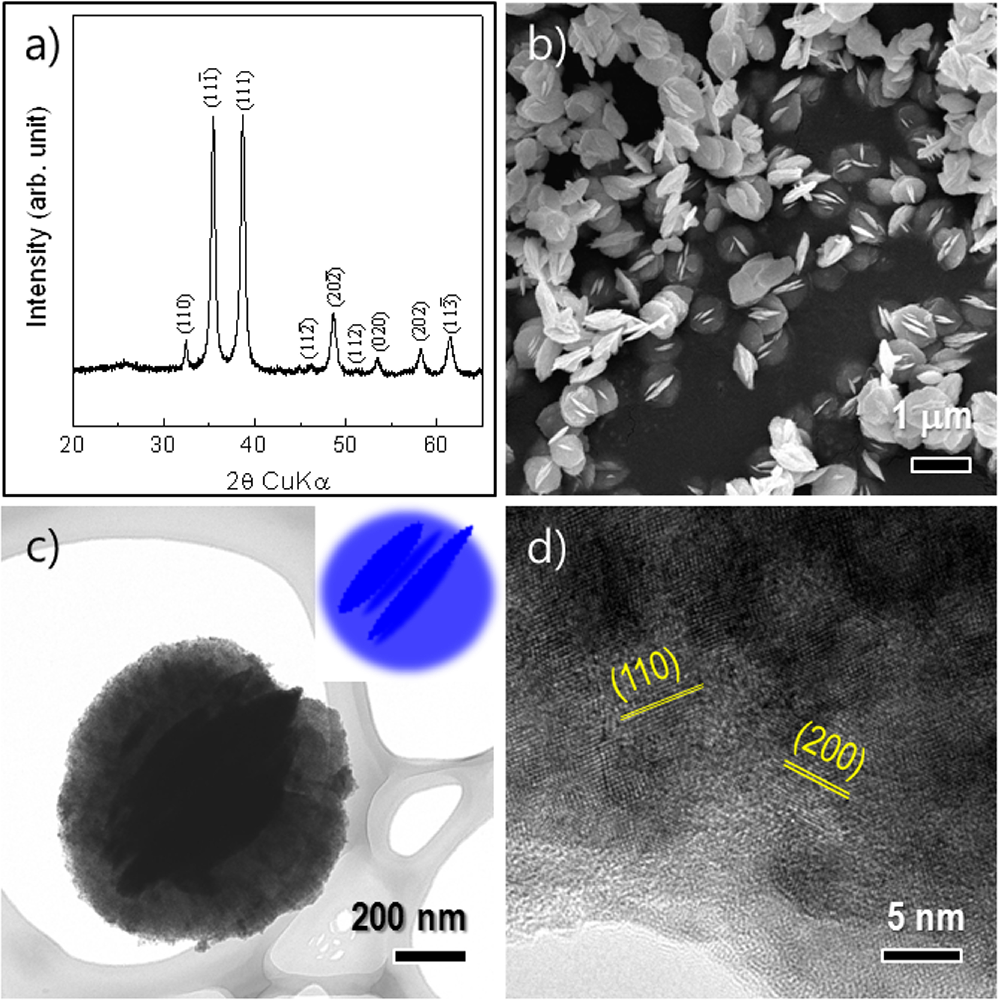

In [48]:

from IPython.display import display
from PIL import Image
path="PMC3211491/pdfimages/image.3.1.64_532.102_571/raw.png"
display(Image.open(path))

import ipyplot
images_array = [\
            "PMC3211491/pdfimages/image.3.1.64_532.102_571/raw.png",\
            "PMC3211491/pdfimages/image.4.1.64_532.102_336/raw.png",\
            "PMC3211491/pdfimages/image.4.2.313_531.492_708/raw.png",\
            "PMC3211491/pdfimages/image.5.1.63_533.240_708/raw.png",\
            "PMC3211491/pdfimages/image.6.1.63_286.483_698/raw.png",\
            "PMC3211491/pdfimages/image.6.2.311_534.102_322/raw.png"\
]

ipyplot.plot_images(images_array, max_images=20, img_width=300)

In [ ]:
from IPython.display import display
from PIL import Image
path="/path/to/image.jpg"
display(Image.open(path))

In [34]:
! pwd

/Users/pm286/workspace/work/battery10


In [35]:
!ls 

PMC3211491        PMC3893646        PMC4148673        pdf2octree.ipynb
PMC3463005        PMC3909895        PMC4177134
PMC3518813        PMC4062906        logs
PMC3776197        PMC4100024        make_project.json


In [39]:
!ls PMC3211491/pdfimages/image.3.1.64_532.102_571/raw.png

PMC3211491/pdfimages/image.3.1.64_532.102_571/raw.png


In [37]:
!tree PMC3211491

PMC3211491
├── eupmc_result.json
├── fulltext.pdf
├── pdfimages
│   ├── image.3.1.64_532.102_571
│   │   ├── images.html
│   │   ├── octree
│   │   │   ├── binary.png
│   │   │   ├── channel.3030fd.png
│   │   │   ├── channel.383838.png
│   │   │   ├── channel.7e8040.png
│   │   │   ├── channel.7e80f3.png
│   │   │   ├── channel.807e3f.png
│   │   │   ├── channel.807ef9.png
│   │   │   ├── channel.cbcb1a.png
│   │   │   ├── channel.ffff80.png
│   │   │   ├── histogram.svg
│   │   │   └── octree.png
│   │   ├── raw.png
│   │   └── raw_o8.png
│   ├── image.4.1.64_532.102_336
│   │   └── raw.png
│   ├── image.4.2.313_531.492_708
│   │   └── raw.png
│   ├── image.5.1.63_533.240_708
│   │   └── raw.png
│   ├── image.6.1.63_286.483_698
│   │   └── raw.png
│   └── image.6.2.311_534.102_322
│       └── raw.png
└── svg
    ├── fulltext-page.0.svg
    ├── fulltext-page.1.svg
    ├── fulltext-page.2.svg
    ├── fulltext-page.3.svg
    ├── fulltext-page.4.svg
    ├── fulltext-page.5.svg
    └── fu

In [55]:
images_array = [\
"PMC3211491/pdfimages/image.4.2.313_531.492_708/raw.png",\
"PMC3463005/pdfimages/image.6.2.86_509.389_714/raw.png",\
"PMC3518813/pdfimages/image.2.2.129_466.69_338/raw.png",\
"PMC3776197/pdfimages/image.4.2.58_538.371_714/raw.png",\
"PMC3776197/pdfimages/image.5.2.107_488.253_704/raw.png",\
"PMC3776197/pdfimages/image.7.2.113_483.69_352/raw.png",\
"PMC3893646/pdfimages/image.5.2.48_547.69_472/raw.png",\
"PMC4062906/pdfimages/image.5.1.66_281.517_691/raw.png",\
"PMC4148673/pdfimages/image.3.2.63_272.69_527/raw.png"\
]
ipyplot.plot_images(images_array, max_images=20, img_width=300)


In [56]:
cd PMC3211491/pdfimages/image.4.2.313_531.492_708/octree

/Users/pm286/workspace/work/battery10/PMC3211491/pdfimages/image.4.2.313_531.492_708/octree


In [58]:
ls channel*.png

channel.171fe9.png  channel.201e20.png  channel.a875aa.png  channel.eb2019.png
channel.1cf71d.png  channel.62a4cc.png  channel.d0a05c.png  channel.fcfcfc.png


In [84]:
import glob
image_array = glob.glob("channel*.png")
# print (image_array)
image_array2 = ["PMC3211491/pdfimages/image.4.2.313_531.492_708/octree/" + s for s in image_array]
print(image_array2)
# ! cd /Users/pm286/workspace/work/battery10/PMC3211491/pdfimages/image.4.2.313_531.492_708/octree
ipyplot.plot_images(image_array2, max_images=20, img_width=300)

['channel.d0a05c.png', 'channel.201e20.png', 'channel.a875aa.png', 'channel.62a4cc.png', 'channel.1cf71d.png', 'channel.fcfcfc.png', 'channel.171fe9.png', 'channel.eb2019.png']
['PMC3211491/pdfimages/image.4.2.313_531.492_708/octree/channel.d0a05c.png', 'PMC3211491/pdfimages/image.4.2.313_531.492_708/octree/channel.201e20.png', 'PMC3211491/pdfimages/image.4.2.313_531.492_708/octree/channel.a875aa.png', 'PMC3211491/pdfimages/image.4.2.313_531.492_708/octree/channel.62a4cc.png', 'PMC3211491/pdfimages/image.4.2.313_531.492_708/octree/channel.1cf71d.png', 'PMC3211491/pdfimages/image.4.2.313_531.492_708/octree/channel.fcfcfc.png', 'PMC3211491/pdfimages/image.4.2.313_531.492_708/octree/channel.171fe9.png', 'PMC3211491/pdfimages/image.4.2.313_531.492_708/octree/channel.eb2019.png']


In [71]:
import os
! cd $PROJECT_WORK
! ls
! pwd
os.listdir(".")

binary.png         channel.201e20.png channel.d0a05c.png histogram.svg
channel.171fe9.png channel.62a4cc.png channel.eb2019.png octree.png
channel.1cf71d.png channel.a875aa.png channel.fcfcfc.png
/Users/pm286/workspace/work/battery10/PMC3211491/pdfimages/image.4.2.313_531.492_708/octree


['histogram.svg',
 'channel.d0a05c.png',
 'channel.201e20.png',
 'channel.a875aa.png',
 'channel.62a4cc.png',
 'octree.png',
 'channel.1cf71d.png',
 'channel.fcfcfc.png',
 'channel.171fe9.png',
 'channel.eb2019.png',
 'binary.png']